In [83]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, RandomSampler
from torchvision.utils import make_grid
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import os
from tqdm import tqdm

In [84]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
if not os.path.exists("/kaggle/working/images"):
    os.mkdir('/kaggle/working/images')
device

'cuda'

In [85]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
    ])

In [86]:
BATCH = 16
shuffle=False
num_classes = len(os.listdir('/kaggle/input/aid-scene-classification-datasets/AID'))

In [87]:
class OneHotAID(torch.utils.data.Dataset):
    def __init__(self, base_dataset, num_classes):
        self.dataset = base_dataset
        self.num_classes = num_classes

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        img, label = self.dataset[idx]
        one_hot = F.one_hot(torch.tensor(label), num_classes=self.num_classes)
        return img,one_hot

In [88]:
dataset = datasets.ImageFolder('/kaggle/input/aid-scene-classification-datasets/AID', transform=transform)
sample_dataset = RandomSampler(dataset, num_samples=1024)

In [89]:
one_hot_dataset = OneHotAID(dataset, num_classes)
data_loader = DataLoader(one_hot_dataset, batch_size=BATCH, shuffle=shuffle, num_workers=4, pin_memory=True, sampler=sample_dataset)

In [90]:
for imgs, labels in data_loader:
    imgs=imgs.to(device)
    labels=labels.to(device)
    break

In [91]:
imgs.shape, labels.shape

(torch.Size([16, 3, 256, 256]), torch.Size([16, 30]))

In [92]:
imgs.max(), imgs.min()

(tensor(1., device='cuda:0'), tensor(-1., device='cuda:0'))

In [93]:
def upsample_block(scale_factor, in_channels, out_channels, kernel_size, stride=1, padding=0, last_layer = True):
    return (
            # nn.ConvTranspose2d(in_channels=in_channels, out_channels=in_channels, kernel_size=4,stride=2,padding=1), # doubles up the shape
            nn.Upsample(scale_factor=scale_factor, mode ='bilinear', align_corners = True),
            nn.BatchNorm2d(in_channels),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2,inplace=True),
            # nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding, bias=False),
            # nn.BatchNorm2d(out_channels),
            # nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2,inplace=True) if not last_layer else nn.Tanh()
    )
class Generator(nn.Module):
    def __init__(self, z_dim, label_dim, n_hidden_layers, hidden_channels):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        self.n_hidden_layers = n_hidden_layers
        self.hidden_channels = hidden_channels

        self.fc = nn.Sequential(
            nn.Linear(in_features=z_dim, out_features=z_dim*4),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(in_features=z_dim*4, out_features=32*32*2),
            nn.LeakyReLU(0.2,inplace=True)
        )

        self.label_projector = nn.Sequential(
            nn.Linear(in_features=label_dim, out_features=256),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(in_features=256, out_features=512),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(in_features=512, out_features=32*32*2),
            nn.LeakyReLU(0.2,inplace=True)
        )

        self.in_channels = 4 # after the fully connected network it will be converted to 32x32 images
        layers = [
            *upsample_block(scale_factor=2, in_channels=self.in_channels, out_channels=hidden_channels[0], kernel_size=3, stride=1, padding=1, last_layer=False),
        ]
        for i in range(n_hidden_layers-1):
            if i==n_hidden_layers-2:
                # if last upsample block then it will add sigmoid else relu
                ub = *upsample_block(scale_factor=2, in_channels=hidden_channels[i], out_channels=hidden_channels[i+1], kernel_size=3, stride=1, padding=1, last_layer=True),
            else:
                ub = *upsample_block(scale_factor=2, in_channels=hidden_channels[i], out_channels=hidden_channels[i+1], kernel_size=3, stride=1, padding=1, last_layer=False),
            for l in ub:
                layers.append(l)

        self.upsample = nn.Sequential(*layers)
    
    def forward(self, z, labels):
        # cat = torch.cat((z, labels), axis=1)

        labels = labels.type(torch.float32)
        
        projected = self.fc(z)

        label_projected = self.label_projector(labels)

        cat = torch.cat((projected, label_projected), -1)

        reshaped = cat.view((-1, self.in_channels, 32, 32))

        upsampled = self.upsample(reshaped)

        return upsampled

In [94]:
generator = Generator(z_dim=64, label_dim=num_classes, n_hidden_layers=3, hidden_channels=[128, 128, 3]).to(device)

In [95]:
generator

Generator(
  (fc): Sequential(
    (0): Linear(in_features=64, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=256, out_features=2048, bias=True)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (label_projector): Sequential(
    (0): Linear(in_features=30, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Linear(in_features=512, out_features=2048, bias=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (upsample): Sequential(
    (0): Upsample(scale_factor=2.0, mode='bilinear')
    (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(4, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=

In [96]:
z = torch.randn((BATCH,64)).to(device)

In [97]:
z.device, labels.device

(device(type='cuda', index=0), device(type='cuda', index=0))

In [98]:
fake = generator(z, labels)

In [99]:
fake.shape

torch.Size([16, 3, 256, 256])

In [100]:
class Discriminator(nn.Module):
    def __init__(self, num_classes, img_channels):
        super(Discriminator, self).__init__()
        self.critic = nn.Sequential(
            nn.Conv2d(in_channels=img_channels, out_channels=64, kernel_size=4, stride=2, padding=0, bias=False), # 128
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=2, stride=2, padding=0, bias=False), # 64
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=2, stride=2, padding=0, bias=False), # 32
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=2, stride=2, padding=0, bias=False), # 16
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=4, stride=2, padding=0, bias=False), # 4
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=4, stride=2, padding=0, bias=False), # 2
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.label_projector = nn.Sequential(
            nn.Linear(in_features=num_classes, out_features=256),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(in_features=256, out_features=512),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(in_features=512, out_features=512),
            nn.LeakyReLU(0.2,inplace=True)
        )
        self.feature_extractor = nn.Sequential(
            nn.Linear(in_features=2*2*128, out_features=256),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(in_features=256, out_features=512),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(in_features=512, out_features=512),
            nn.LeakyReLU(0.2,inplace=True)
        )
        self.fc = nn.Sequential(
            nn.Linear(in_features=1024, out_features=512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(in_features=512, out_features=128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(in_features=128, out_features=16),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(in_features=16, out_features=1),
            # nn.Sigmoid(),
        )
    
    def forward(self, images, labels):
        labels = labels.type(torch.float32)

        conved = self.critic(images)

        flat = conved.view((conved.shape[0], 2*2*128))

        features = self.feature_extractor(flat)

        label_projected = self.label_projector(labels)

        cat = torch.cat((features, label_projected), 1) # concat in axis=1
        # added = flat+label_projected
        output = self.fc(cat)

        return output

In [101]:
discriminator = Discriminator(num_classes=num_classes, img_channels=3).to(device)

In [102]:
pred = discriminator(fake, labels)

In [103]:
pred.shape

torch.Size([16, 1])

In [104]:
def disc_loss(loss_fn, gen_model, disc_model, images, labels, z_dim):
    batch = labels.shape[0]
    noise = torch.randn((batch, z_dim)).to(device)

    fake_imgs = gen_model(noise, labels)

    fake_pred = disc_model(fake_imgs.detach(), labels) # detach the generator while training the discriminator
    real_pred = disc_model(images, labels)

    fake_target = torch.zeros_like(fake_pred)+0.05
    real_target = torch.ones_like(real_pred)*0.95

    fake_loss = loss_fn(fake_pred, fake_target)
    real_loss = loss_fn(real_pred, real_target)

    return (fake_loss + real_loss)/2

def gen_loss(loss_fn, gen_model, disc_model, labels, z_dim):
    batch = labels.shape[0]
    noise = torch.randn((batch, z_dim)).to(device)

    fake_images = gen_model(noise, labels)
    fake_pred = disc_model(fake_images, labels)

    fake_target = torch.ones_like(fake_pred)*0.95
    loss = loss_fn(fake_pred, fake_target)

    return loss

def show(tensor, ch = 3, size = (256,256), n_imgs = 25, epoch = 0, save=False):
    data = tensor.detach().cpu().view(-1, ch, *size)
    reshaped = make_grid(data[:n_imgs], nrow=5).permute(1,2,0) # from C,H,W to H,W,C
    plt.imshow(reshaped)
    plt.title(f"Epoch: {epoch}")
    plt.axis('off')
    if save:
        plt.savefig(f"/kaggle/working/images/fake_{epoch}.png")
    plt.show()

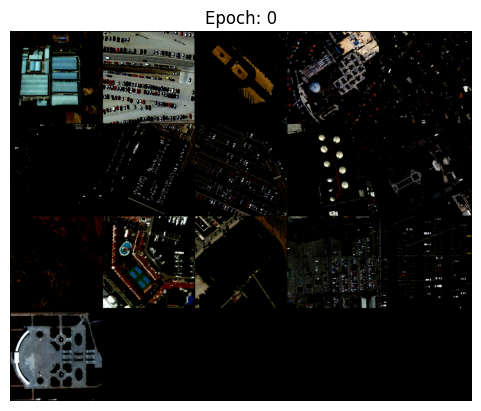

In [105]:
show(imgs)

In [106]:
lr = 0.0003
k=2
log_step=1
EPOCHS = 200

In [107]:
base_loss = nn.BCEWithLogitsLoss()
gen_opt = torch.optim.Adam(generator.parameters(), lr = lr, betas=(0.5,0.99))
disc_opt = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5,0.99))

EPOCH: 0 startng...


100%|██████████| 64/64 [00:16<00:00,  3.80it/s]


Mean Gen Loss: 2698.713198661804, Mean Disc Loss: 402.2079257965088


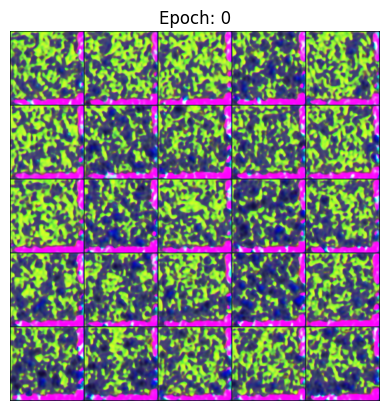

EPOCH: 1 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2648.488832473755, Mean Disc Loss: 299.7850946187973


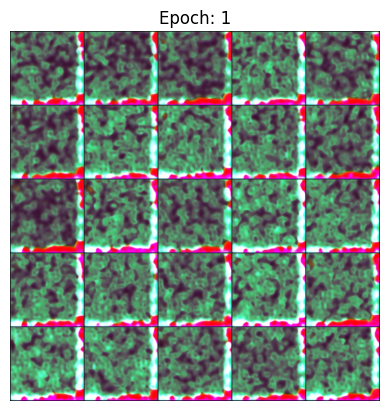

EPOCH: 2 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2856.0832901000977, Mean Disc Loss: 238.69388484954834


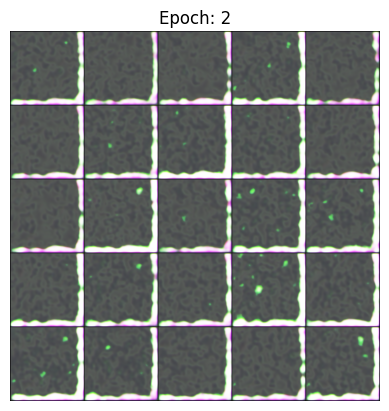

EPOCH: 3 startng...


100%|██████████| 64/64 [00:16<00:00,  3.82it/s]


Mean Gen Loss: 2730.3874769210815, Mean Disc Loss: 262.2557784318924


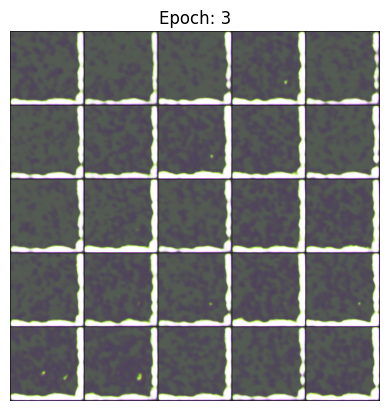

EPOCH: 4 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 3013.050838470459, Mean Disc Loss: 245.63478302955627


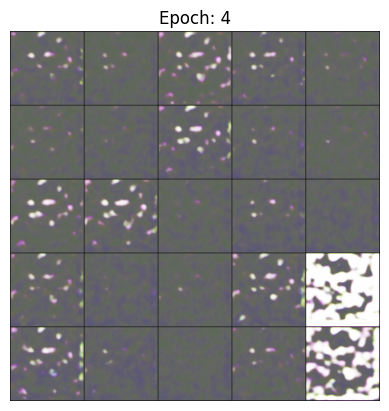

EPOCH: 5 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2926.3369789123535, Mean Disc Loss: 235.55080115795135


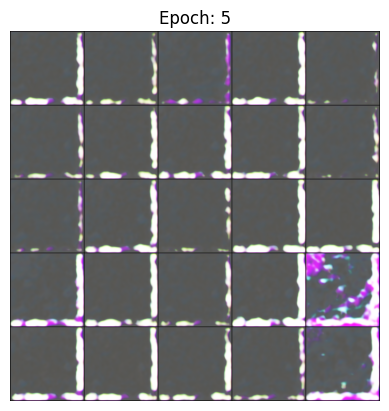

EPOCH: 6 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2952.4213066101074, Mean Disc Loss: 213.64458417892456


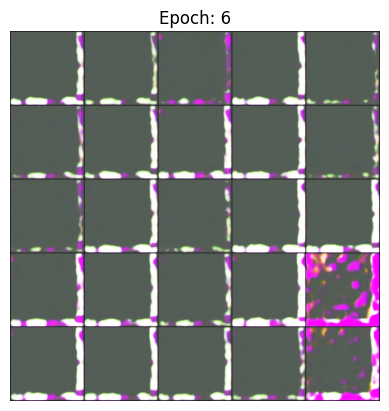

EPOCH: 7 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2838.0859298706055, Mean Disc Loss: 244.01725733280182


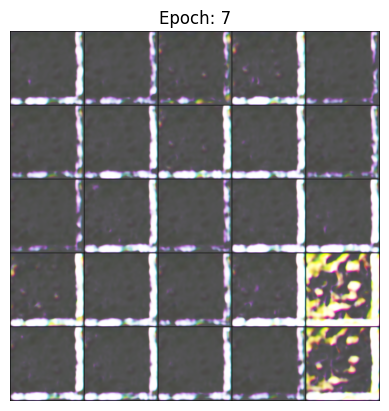

EPOCH: 8 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2952.0813789367676, Mean Disc Loss: 216.91965806484222


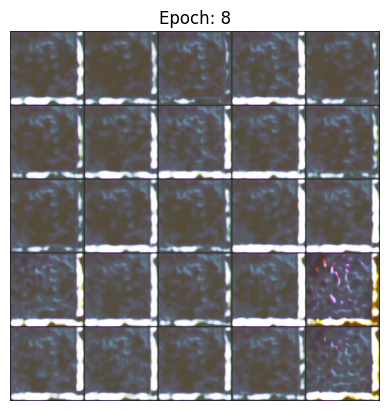

EPOCH: 9 startng...


100%|██████████| 64/64 [00:16<00:00,  3.81it/s]


Mean Gen Loss: 2413.0649394989014, Mean Disc Loss: 354.3589073419571


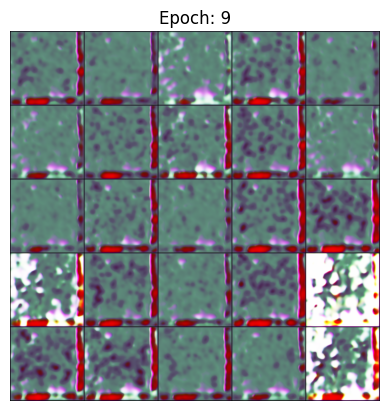

EPOCH: 10 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2898.480796813965, Mean Disc Loss: 214.67702984809875


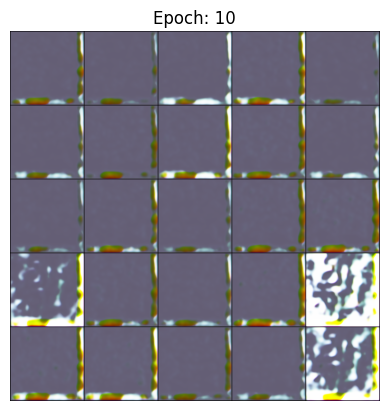

EPOCH: 11 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2935.6774978637695, Mean Disc Loss: 207.35847520828247


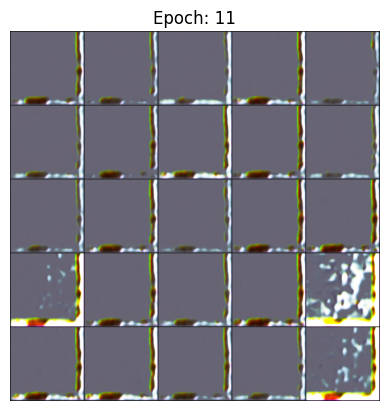

EPOCH: 12 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2611.182716369629, Mean Disc Loss: 324.20618748664856


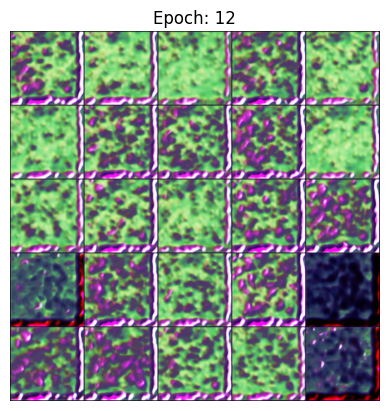

EPOCH: 13 startng...


100%|██████████| 64/64 [00:16<00:00,  3.82it/s]


Mean Gen Loss: 2443.4900274276733, Mean Disc Loss: 346.6271138191223


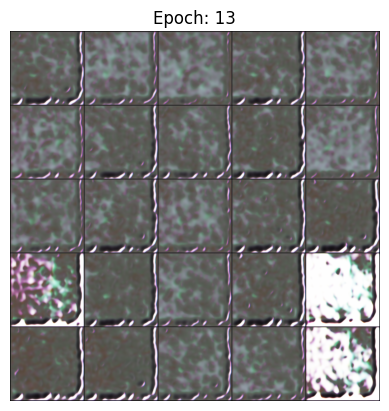

EPOCH: 14 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2676.549307823181, Mean Disc Loss: 336.50783705711365


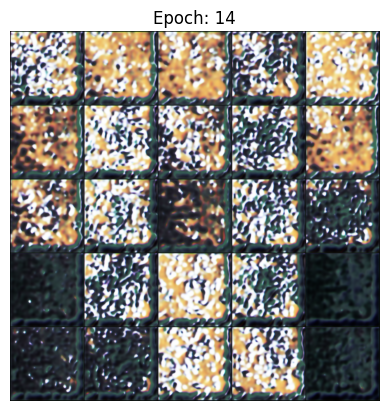

EPOCH: 15 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2731.743501663208, Mean Disc Loss: 304.1326104402542


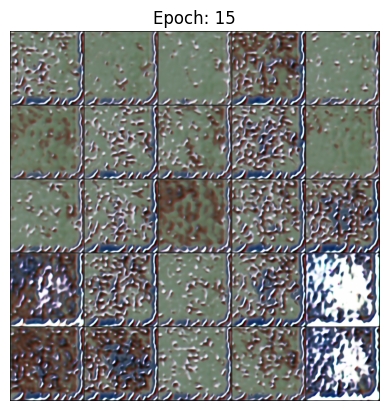

EPOCH: 16 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2699.028907775879, Mean Disc Loss: 279.6214793920517


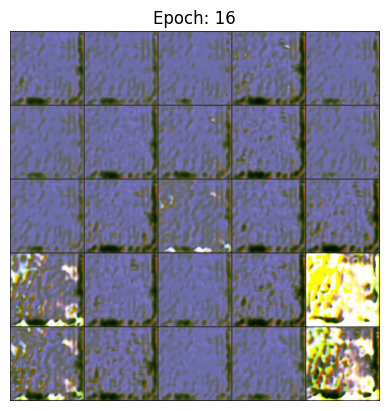

EPOCH: 17 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2989.9951782226562, Mean Disc Loss: 210.44240200519562


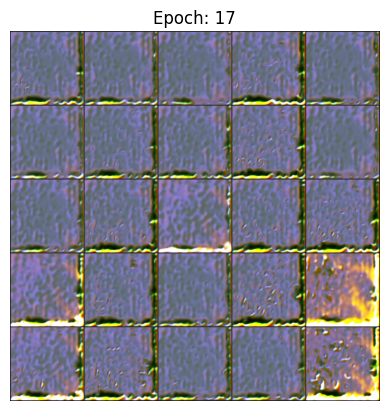

EPOCH: 18 startng...


100%|██████████| 64/64 [00:16<00:00,  3.80it/s]


Mean Gen Loss: 2459.5917644500732, Mean Disc Loss: 343.5722955465317


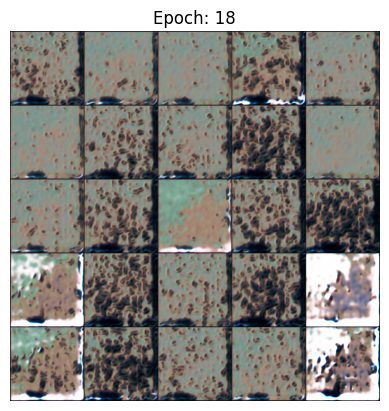

EPOCH: 19 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2770.4000148773193, Mean Disc Loss: 280.9049748182297


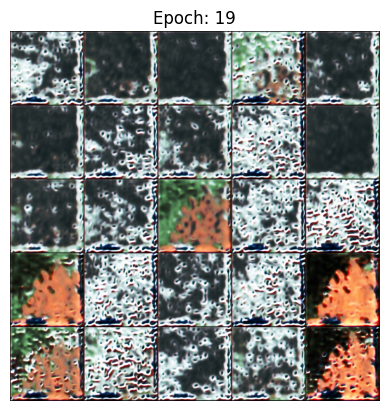

EPOCH: 20 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2355.7272186279297, Mean Disc Loss: 353.0578042268753


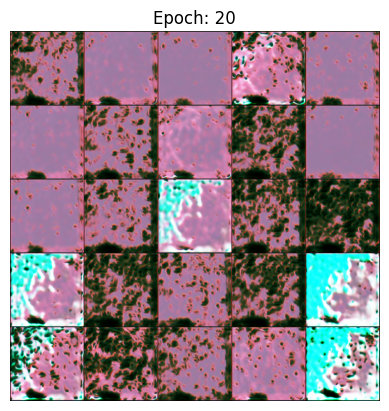

EPOCH: 21 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2658.368682861328, Mean Disc Loss: 304.26865231990814


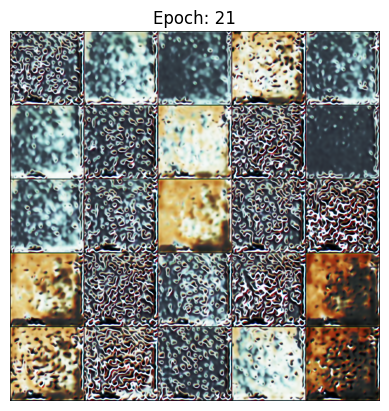

EPOCH: 22 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2450.59308719635, Mean Disc Loss: 344.5795820951462


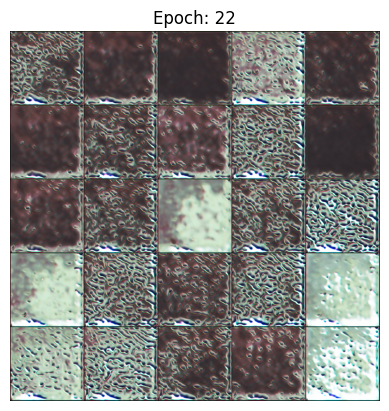

EPOCH: 23 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2408.1308765411377, Mean Disc Loss: 328.7655346393585


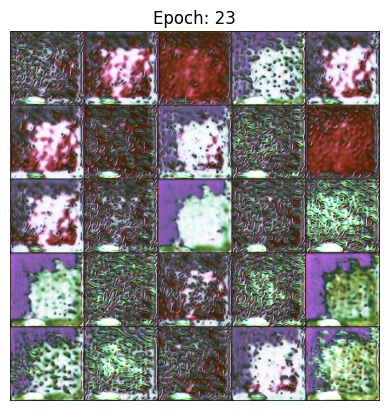

EPOCH: 24 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2859.0150394439697, Mean Disc Loss: 246.23529720306396


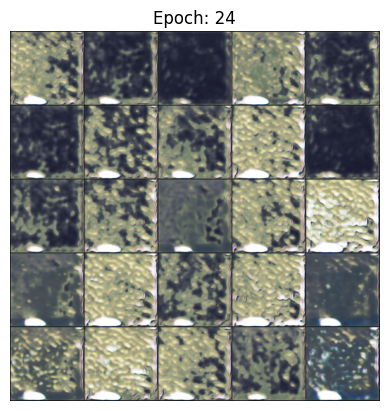

EPOCH: 25 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2808.2346715927124, Mean Disc Loss: 260.16174733638763


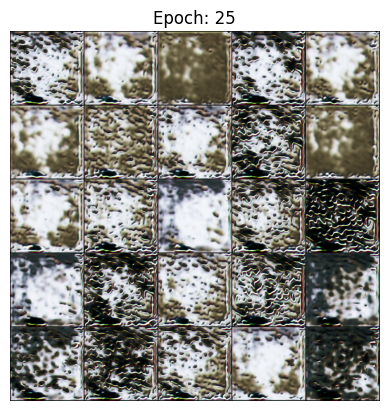

EPOCH: 26 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2396.317132949829, Mean Disc Loss: 357.5868409872055


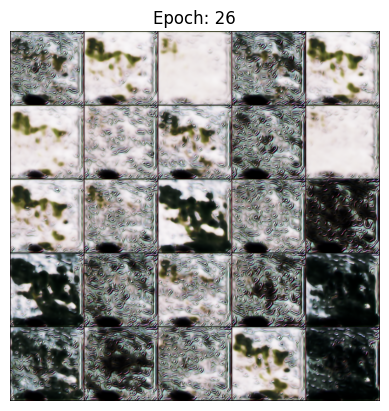

EPOCH: 27 startng...


100%|██████████| 64/64 [00:16<00:00,  3.79it/s]


Mean Gen Loss: 2529.8211097717285, Mean Disc Loss: 332.07822239398956


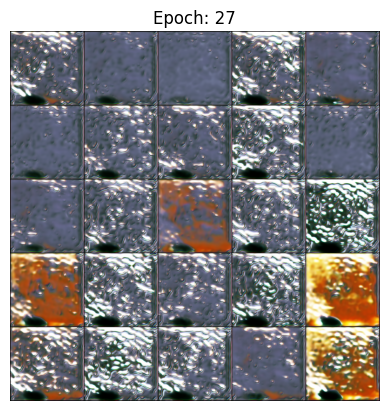

EPOCH: 28 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2677.643991470337, Mean Disc Loss: 298.3581849336624


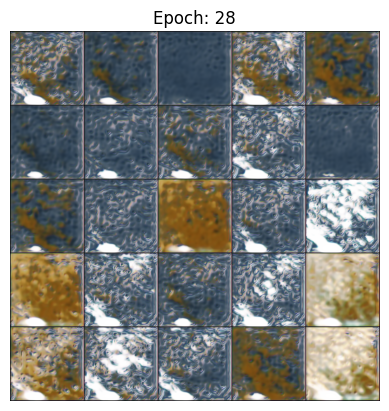

EPOCH: 29 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2580.26375579834, Mean Disc Loss: 323.49069452285767


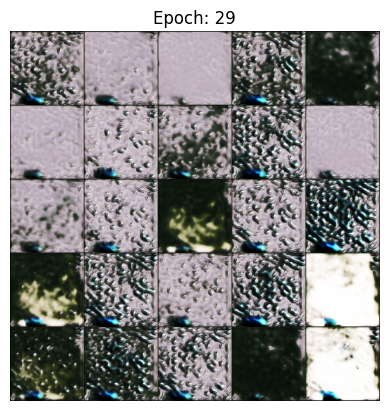

EPOCH: 30 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2351.1547622680664, Mean Disc Loss: 355.33211505413055


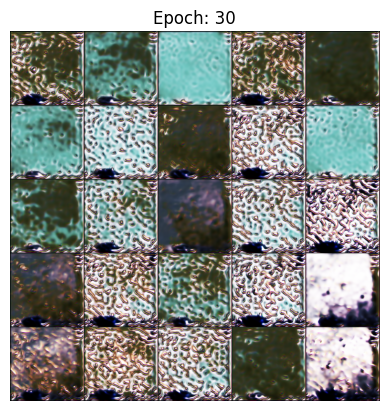

EPOCH: 31 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2613.827220916748, Mean Disc Loss: 310.9994932413101


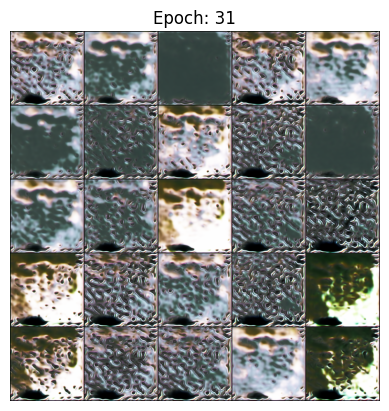

EPOCH: 32 startng...


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]


Mean Gen Loss: 2415.6478872299194, Mean Disc Loss: 354.01453399658203


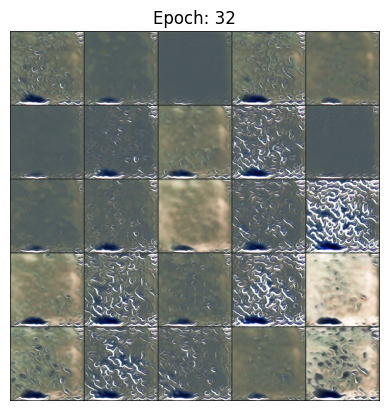

EPOCH: 33 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2345.916358947754, Mean Disc Loss: 366.23234272003174


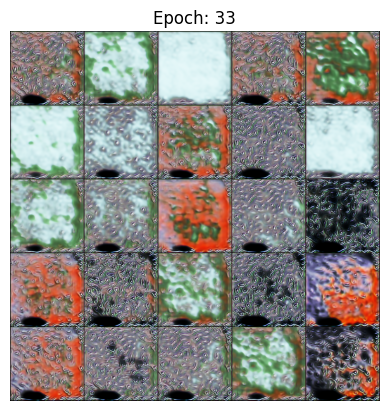

EPOCH: 34 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 1994.4803647994995, Mean Disc Loss: 456.8999630212784


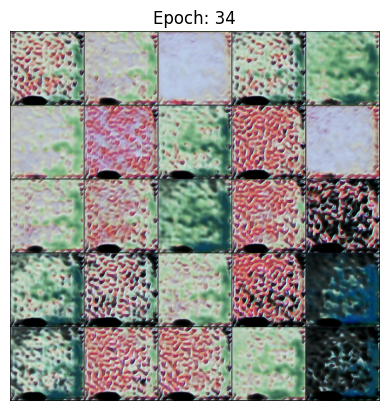

EPOCH: 35 startng...


100%|██████████| 64/64 [00:16<00:00,  3.82it/s]


Mean Gen Loss: 2886.211072921753, Mean Disc Loss: 265.5288976430893


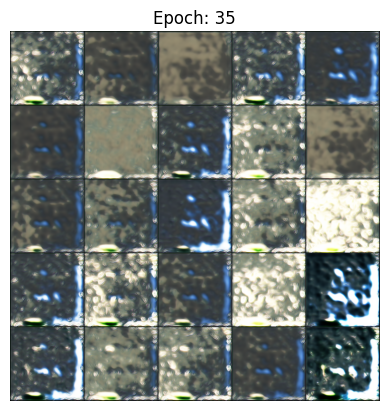

EPOCH: 36 startng...


100%|██████████| 64/64 [00:16<00:00,  3.79it/s]


Mean Gen Loss: 2401.5870265960693, Mean Disc Loss: 378.1222496032715


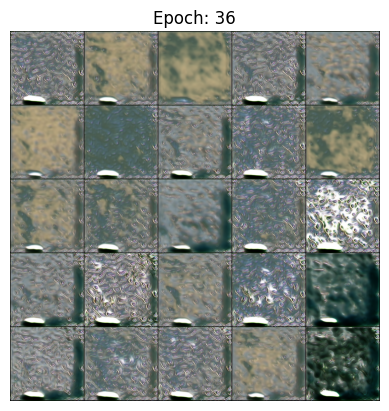

EPOCH: 37 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2584.142045021057, Mean Disc Loss: 362.4257917404175


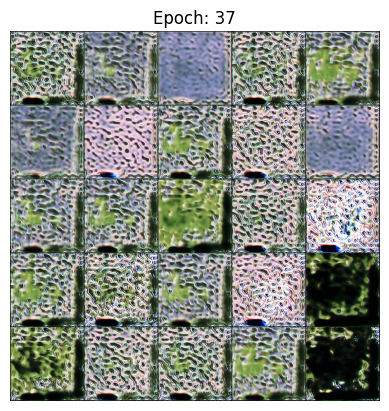

EPOCH: 38 startng...


100%|██████████| 64/64 [00:16<00:00,  3.82it/s]


Mean Gen Loss: 2621.978141784668, Mean Disc Loss: 355.9126706123352


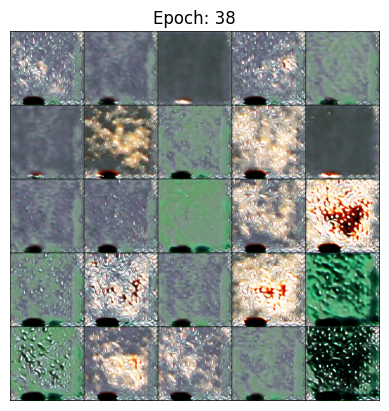

EPOCH: 39 startng...


100%|██████████| 64/64 [00:16<00:00,  3.82it/s]


Mean Gen Loss: 2454.419502258301, Mean Disc Loss: 383.1295244693756


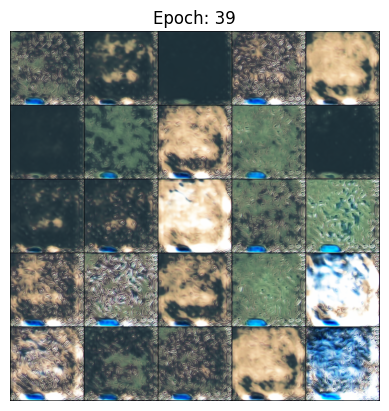

EPOCH: 40 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2685.2353439331055, Mean Disc Loss: 344.38986670970917


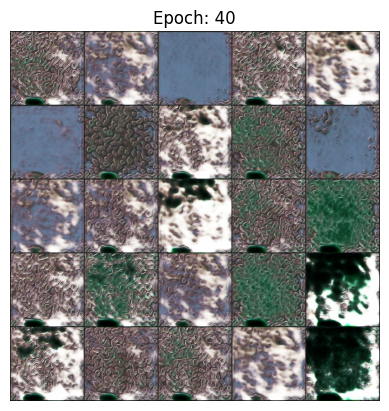

EPOCH: 41 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2579.007860183716, Mean Disc Loss: 345.4102177619934


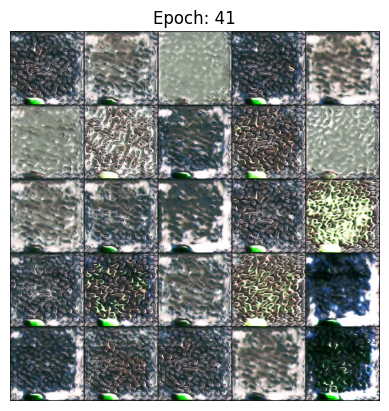

EPOCH: 42 startng...


100%|██████████| 64/64 [00:16<00:00,  3.82it/s]


Mean Gen Loss: 2621.181369781494, Mean Disc Loss: 321.7440742254257


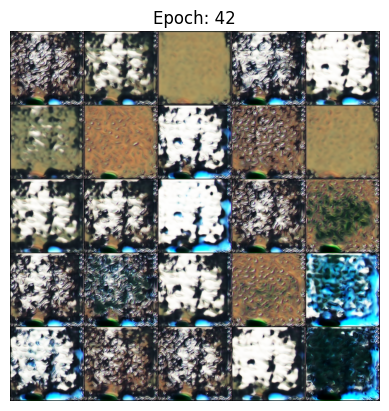

EPOCH: 43 startng...


100%|██████████| 64/64 [00:16<00:00,  3.82it/s]


Mean Gen Loss: 2583.231943130493, Mean Disc Loss: 356.5417345762253


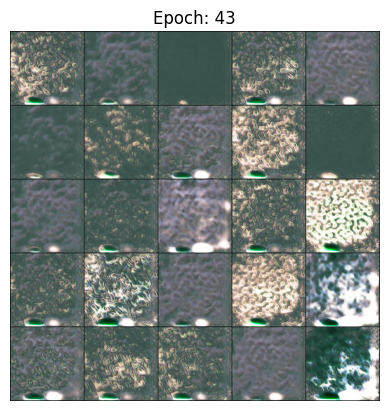

EPOCH: 44 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2344.5249438285828, Mean Disc Loss: 371.24267172813416


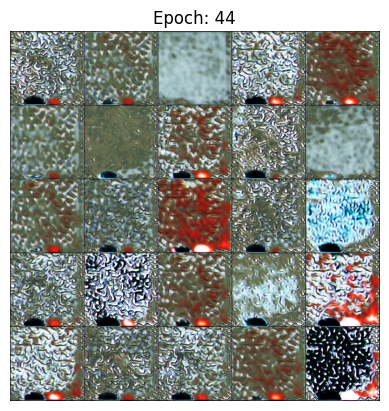

EPOCH: 45 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2703.641315460205, Mean Disc Loss: 347.0372325181961


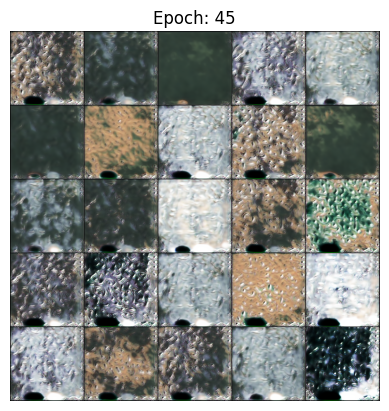

EPOCH: 46 startng...


100%|██████████| 64/64 [00:16<00:00,  3.82it/s]


Mean Gen Loss: 2856.684063911438, Mean Disc Loss: 297.0822376012802


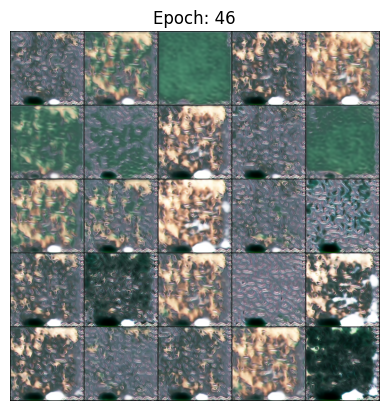

EPOCH: 47 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2723.7208003997803, Mean Disc Loss: 301.15858793258667


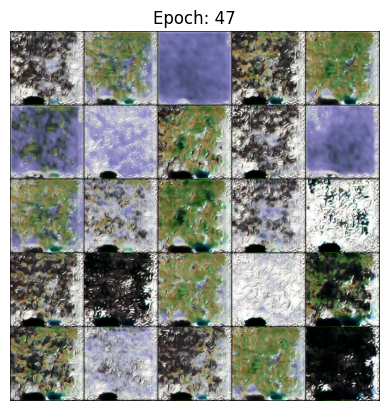

EPOCH: 48 startng...


100%|██████████| 64/64 [00:16<00:00,  3.82it/s]


Mean Gen Loss: 2638.0063524246216, Mean Disc Loss: 341.727392077446


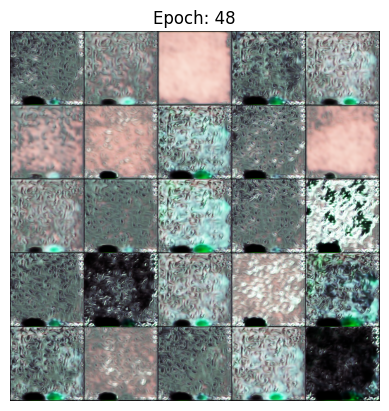

EPOCH: 49 startng...


100%|██████████| 64/64 [00:16<00:00,  3.83it/s]


Mean Gen Loss: 2664.429738998413, Mean Disc Loss: 303.12159740924835


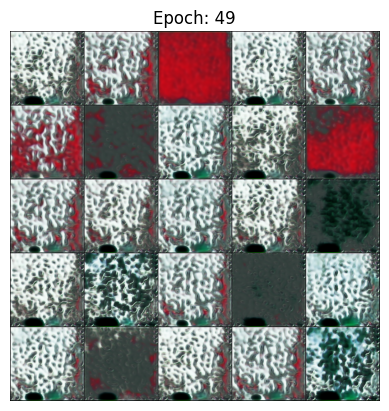

EPOCH: 50 startng...


 38%|███▊      | 24/64 [00:06<00:10,  3.64it/s]


KeyboardInterrupt: 

In [108]:
z = torch.randn((25, 64)).to(device)
test_labels = F.one_hot(torch.LongTensor([i+1 for i in range(25)]), num_classes=num_classes).to(device)
for i in range(EPOCHS):
    print(f"EPOCH: {i} startng...")
    mean_gen_loss = 0
    mean_disc_loss = 0
    batch = 0
    for imgs, labels in tqdm(data_loader):
        b = labels.shape[0]

        imgs = imgs.to(device)
        labels = labels.to(device)

        for ik in range(k):
            disc_opt.zero_grad()
            disc_loss_ = disc_loss(loss_fn=base_loss, gen_model=generator, disc_model=discriminator, images=imgs, labels=labels, z_dim=64)
            mean_disc_loss += disc_loss_.item()*b/k
            disc_loss_.backward()
            disc_opt.step()
        
        gen_opt.zero_grad()
        gen_loss_ = gen_loss(loss_fn=base_loss, gen_model=generator, disc_model=discriminator, labels=labels, z_dim=64)
        mean_gen_loss += gen_loss_.item()*b
        gen_loss_.backward()
        gen_opt.step()
        batch+=b


        # del gen_loss_, disc_loss_
    torch.cuda.empty_cache()


    print(f"Mean Gen Loss: {mean_gen_loss}, Mean Disc Loss: {mean_disc_loss}")
    if i%log_step==0:
        with torch.no_grad():
            fake = (generator(z, test_labels)+1)/2
            # fake = generator(z, test_labels)
        show(fake, epoch=i, save=True)

In [ ]:
labels.shape

torch.Size([32, 30, 30])

In [ ]:
z = torch.randn((25, 64)).to(device)
test_labels = F.one_hot(torch.randint(low=0, high=30, size=(25,)), num_classes=num_classes).to(device)

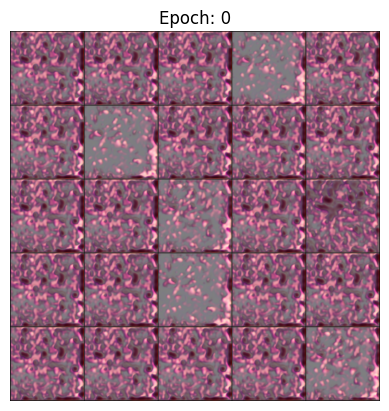

In [ ]:
fake = (generator(z, test_labels)+1)/2
show(fake, epoch=0, save=False)

In [ ]:
fake.max()

tensor(1.0000, device='cuda:0', grad_fn=<MaxBackward1>)